# **Unsupervised Clustering 2.0**




Manual methods to group urban neighbourhoods are at times myopic and often fail to consider every influencing factor.

**Objective**: Automatically and more intelligently group urban neighbourhoods based on data.

In [ ]:
# Colab
from google.colab import widgets
from google.colab import files
import io

# Data manipulation
import json
import numpy as np
import pandas as pd

# Visualisation
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram
import plotly.express as px
from pandas.plotting import scatter_matrix

# Machine Learning
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AgglomerativeClustering, KMeans

# **Importing Data and Scaling**

In [ ]:
# Upload CSV file
uploaded_csv = files.upload()

Saving Combined R,X,Y Values from Datasets.csv to Combined R,X,Y Values from Datasets.csv


In [ ]:
# load CSV to Pandas Dataframe (df)
df_raw = pd.read_csv(io.BytesIO(uploaded_csv['Combined R,X,Y Values from Datasets.csv']))


In [ ]:
# ensure all data-points are numeric
df_raw = df_raw.apply(pd.to_numeric, errors='raise')
df_raw.describe().T

,count,mean,std,min,25%,50%,75%,max
id,13920.0,6.960500e+03,4018.502209,1.0,3480.75,6960.5,10440.25,13920.0
RTerraVeg,8269.0,1.765014e+01,12.016120,0.0,9.00,14.0,24.00,100.0
RHydroGlob,8160.0,1.737255e+00,8.082343,0.0,0.00,0.0,0.00,100.0
RSoilWater,13920.0,3.365891e+01,30.777410,0.0,0.00,52.0,63.00,100.0
RAquaVeg,8694.0,5.768507e+01,17.364664,0.0,50.00,58.0,69.00,100.0
REcoregion,13920.0,5.035532e+01,42.066595,0.0,0.00,86.0,86.00,100.0
RTidalWet,13920.0,1.625718e-01,2.303521,0.0,0.00,0.0,0.00,100.0
RSTRMTopo,8127.0,1.986416e+01,20.046150,0.0,5.00,11.0,30.00,100.0
RBuiltUp,13920.0,6.967960e+00,15.088297,0.0,0.00,0.0,2.00,100.0
RImperv,13920.0,1.010381e+01,22.208570,0.0,0.00,0.0,3.00,100.0


# **Feature (pre)selection**

In [ ]:
# Select subset of columns aka variables
Columns_of_interest = ["RTerraVeg",
                      "RHydroBas",
                      "RImperv",
                      "RBuiltUp",
                      "RSTRMTopo",
                      "RTidalWet",
                      "REcoregion",
                      "RAquaVeg",
                      "RSoilWater",
                      "RHydroGlob",
                      "X",
                      "Y",
                      "id"]

# create new dataframe
df = df_raw[Columns_of_interest]

# **Data Exploration**



*   Correlation Matrix
*   Visualise Distributions
*   Identify Missing Values

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13920 entries, 0 to 13919
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   RTerraVeg   8269 non-null   float64
 1   RHydroBas   8372 non-null   float64
 2   RImperv     13920 non-null  int64  
 3   RBuiltUp    13920 non-null  int64  
 4   RSTRMTopo   8127 non-null   float64
 5   RTidalWet   13920 non-null  int64  
 6   REcoregion  13920 non-null  int64  
 7   RAquaVeg    8694 non-null   float64
 8   RSoilWater  13920 non-null  int64  
 9   RHydroGlob  8160 non-null   float64
 10  X           13920 non-null  int64  
 11  Y           13920 non-null  int64  
 12  id          13920 non-null  int64  
dtypes: float64(5), int64(8)
memory usage: 1.4 MB


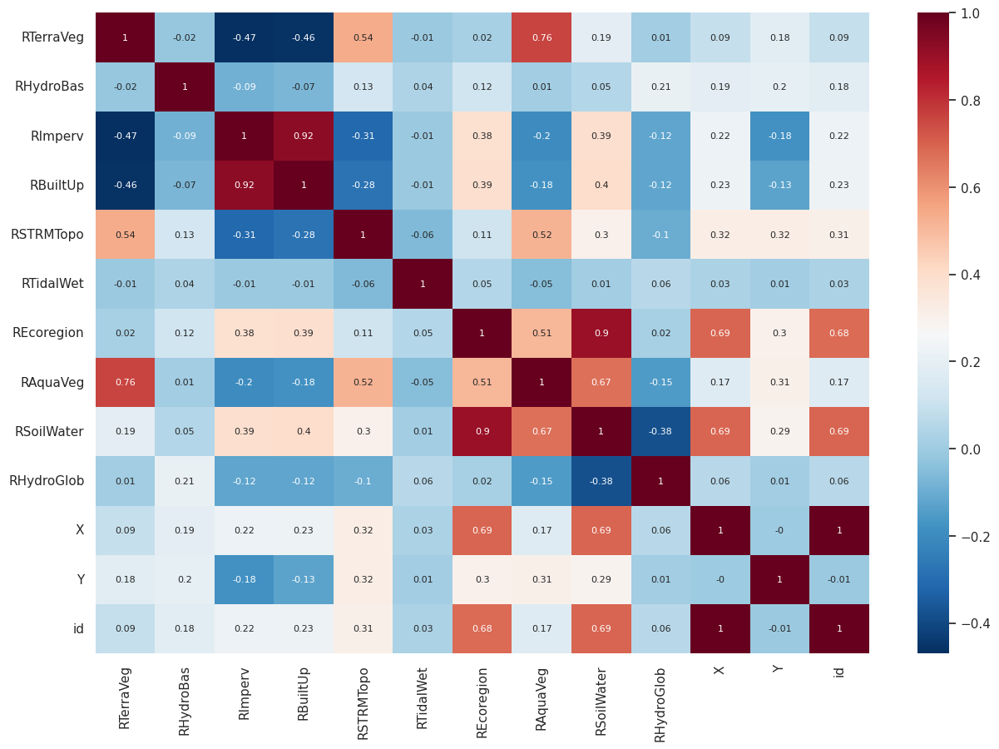

In [ ]:
!pip install seaborn
import seaborn as sns
import pandas as pd

# Assuming df is already defined somewhere in your code

# Finding correlation (uncover correlated variables)
corr = df.corr().round(2)  # Round the correlation values to 2 decimal places

# plot a heatmap with annotation
sns.set(rc={'figure.figsize': (15,10)})
sns.heatmap(corr, annot=True, annot_kws={"size": 8}, cmap='RdBu_r')

# save plot with transparent background
plt.savefig("heatmap.png", transparent=True)


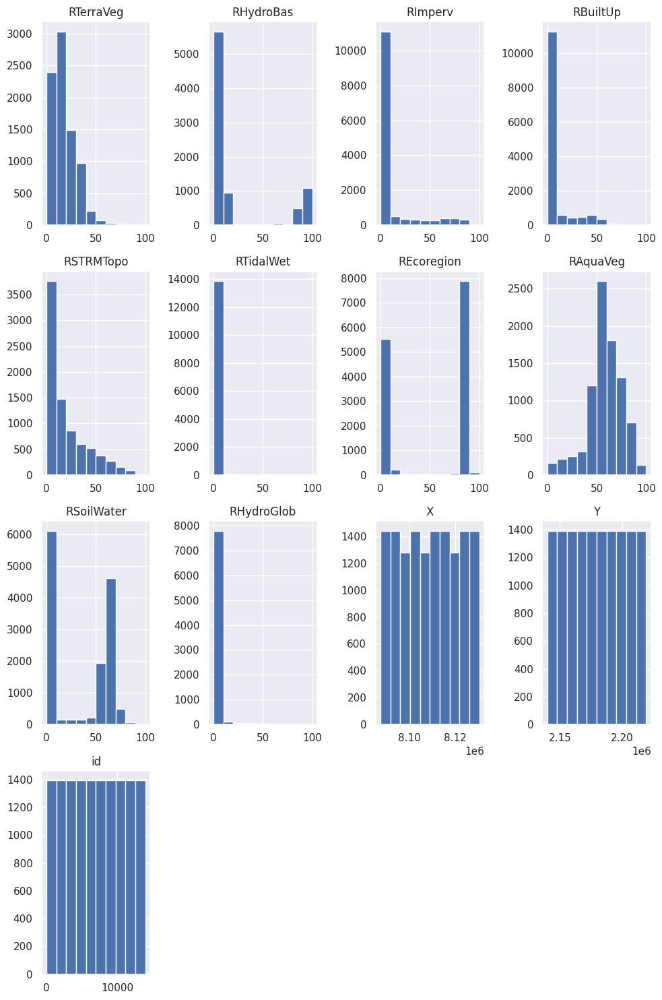

In [ ]:
# Data distribution (histograms) for each variable
ax = df.hist(figsize=(10,15))
plt.tight_layout()
plt.show()


# **Dealing with Missing Values**

In [ ]:
# checking columns for missing values
df.isna().sum()

RTerraVeg     5651
RHydroBas     5548
RImperv          0
RBuiltUp         0
RSTRMTopo     5793
RTidalWet        0
REcoregion       0
RAquaVeg      5226
RSoilWater       0
RHydroGlob    5760
X                0
Y                0
id               0
dtype: int64

In [ ]:
print(df.columns)

Index(['RTerraVeg', 'RHydroBas', 'RImperv', 'RBuiltUp', 'RSTRMTopo',
       'RTidalWet', 'REcoregion', 'RAquaVeg', 'RSoilWater', 'RHydroGlob', 'X',
       'Y', 'id'],
      dtype='object')


In [ ]:
df.loc[df['RTerraVeg'].isna()]

,RTerraVeg,RHydroBas,RImperv,RBuiltUp,RSTRMTopo,RTidalWet,REcoregion,RAquaVeg,RSoilWater,RHydroGlob,X,Y,id
0,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2219414,1
1,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2218914,2
2,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2218414,3
3,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2217914,4
4,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2217414,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13410,NaN,5.0,0,0,NaN,0,0,28.0,0,NaN,8128820,2154414,13411
13411,NaN,5.0,0,0,NaN,0,25,48.0,11,0.0,8128820,2153914,13412
13569,NaN,7.0,1,0,6.0,0,0,34.0,12,7.0,8129320,2154914,13570
13682,NaN,92.0,0,0,14.0,0,86,48.0,30,41.0,8129820,2178414,13683


In [ ]:
df.iloc[27:30, [0, 4]]

,RTerraVeg,RSTRMTopo
27,NaN,NaN
28,NaN,NaN
29,NaN,NaN


# **Data Cleaning**

In [ ]:
# Process missing values
print(df.shape)
print(df.dropna().shape)
print(df.shape)

(13920, 13)
(7903, 13)
(13920, 13)


In [ ]:
print(f"forward fill:\n{df.fillna(method='pad').isna().sum()}")

forward fill:
RTerraVeg     2400
RHydroBas     2400
RImperv          0
RBuiltUp         0
RSTRMTopo     2560
RTidalWet        0
REcoregion       0
RAquaVeg      2080
RSoilWater       0
RHydroGlob    2400
X                0
Y                0
id               0
dtype: int64


In [ ]:
df.fillna(method='pad')

,RTerraVeg,RHydroBas,RImperv,RBuiltUp,RSTRMTopo,RTidalWet,REcoregion,RAquaVeg,RSoilWater,RHydroGlob,X,Y,id
0,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2219414,1
1,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2218914,2
2,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2218414,3
3,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2217914,4
4,NaN,NaN,0,0,NaN,0,0,NaN,0,NaN,8087320,2217414,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13915,8.0,5.0,0,1,6.0,0,86,44.0,70,0.0,8130320,2141914,13916
13916,13.0,5.0,0,0,6.0,0,86,47.0,69,0.0,8130320,2141414,13917
13917,18.0,5.0,0,0,7.0,0,86,52.0,71,1.0,8130320,2140914,13918
13918,15.0,5.0,0,0,10.0,0,86,46.0,68,1.0,8130320,2140414,13919


In [ ]:
print(f"backfill:\n{df.fillna(method='bfill').isna().sum()}")

backfill:
RTerraVeg     0
RHydroBas     0
RImperv       0
RBuiltUp      0
RSTRMTopo     0
RTidalWet     0
REcoregion    0
RAquaVeg      0
RSoilWater    0
RHydroGlob    0
X             0
Y             0
id            0
dtype: int64


In [ ]:
print(f"interpolate:\n{df.interpolate(method='linear').isna().sum()}")

interpolate:
RTerraVeg     2400
RHydroBas     2400
RImperv          0
RBuiltUp         0
RSTRMTopo     2560
RTidalWet        0
REcoregion       0
RAquaVeg      2080
RSoilWater       0
RHydroGlob    2400
X                0
Y                0
id               0
dtype: int64


In [ ]:
df = df.fillna(df.mean())

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
RTerraVeg,13920.0,1.765014e+01,9.261055,0.0,12.00,1.765014e+01,1.765014e+01,100.0
RHydroBas,13920.0,2.353583e+01,26.652396,0.0,6.00,2.353583e+01,2.353583e+01,100.0
RImperv,13920.0,1.010381e+01,22.208570,0.0,0.00,0.000000e+00,3.000000e+00,100.0
RBuiltUp,13920.0,6.967960e+00,15.088297,0.0,0.00,0.000000e+00,2.000000e+00,100.0
RSTRMTopo,13920.0,1.986416e+01,15.316706,0.0,8.00,1.986416e+01,1.986416e+01,100.0
RTidalWet,13920.0,1.625718e-01,2.303521,0.0,0.00,0.000000e+00,0.000000e+00,100.0
REcoregion,13920.0,5.035532e+01,42.066595,0.0,0.00,8.600000e+01,8.600000e+01,100.0
RAquaVeg,13920.0,5.768507e+01,13.722941,0.0,54.00,5.768507e+01,6.200000e+01,100.0
RSoilWater,13920.0,3.365891e+01,30.777410,0.0,0.00,5.200000e+01,6.300000e+01,100.0
RHydroGlob,13920.0,1.737255e+00,6.188020,0.0,0.00,0.000000e+00,1.737255e+00,100.0


# **Data Processing**

In [ ]:
# Extract coords from data
df = df.rename(columns={"X": "X", "Y": "Y"})
df_coords = df[['X', 'Y']]

# df_data   = df["RTerraVeg","RHydroBas","RImperv","RBuiltUp","RSTRMTopo","RTidalWet","REcoregion","RAquaVeg","RSoilWater","RHydroGlob","X","Y","id"]]
df_data   = df.drop(['X', 'Y'], axis=1)

# Scale data
scaler = MinMaxScaler()
scaled_df = pd.DataFrame(
    scaler.fit_transform(df_data),
    columns=df_data.columns)


In [ ]:
# def map_clustering_results(coords, model):
   # labels = model.labels_
    # for label in np.unique(labels):
      #  x = coords['X'].to_numpy()[labels == label]
       # y = coords['Y'].to_numpy()[labels == label]
        # plt.scatter(x, y, s=0.4, label=model.labels_)

import matplotlib.pyplot as plt
import numpy as np

def map_clustering_results(coords, model):
    labels = model.labels_
    unique_labels = np.unique(labels)
    colors = plt.cm.Set1(np.linspace(0, 1, len(unique_labels)))
    for i, label in enumerate(unique_labels):
        x = coords['X'].to_numpy()[labels == label]
        y = coords['Y'].to_numpy()[labels == label]
        plt.scatter(x, y, s=2, c=[colors[i]], label=label)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# **Approach 1: Agglomerative Clustering**

In [ ]:
ac_model = AgglomerativeClustering(
    n_clusters=10,  # Number of classes. Play with this!
)

In [ ]:
ac_model.fit(scaled_df)

AgglomerativeClustering(n_clusters=10)

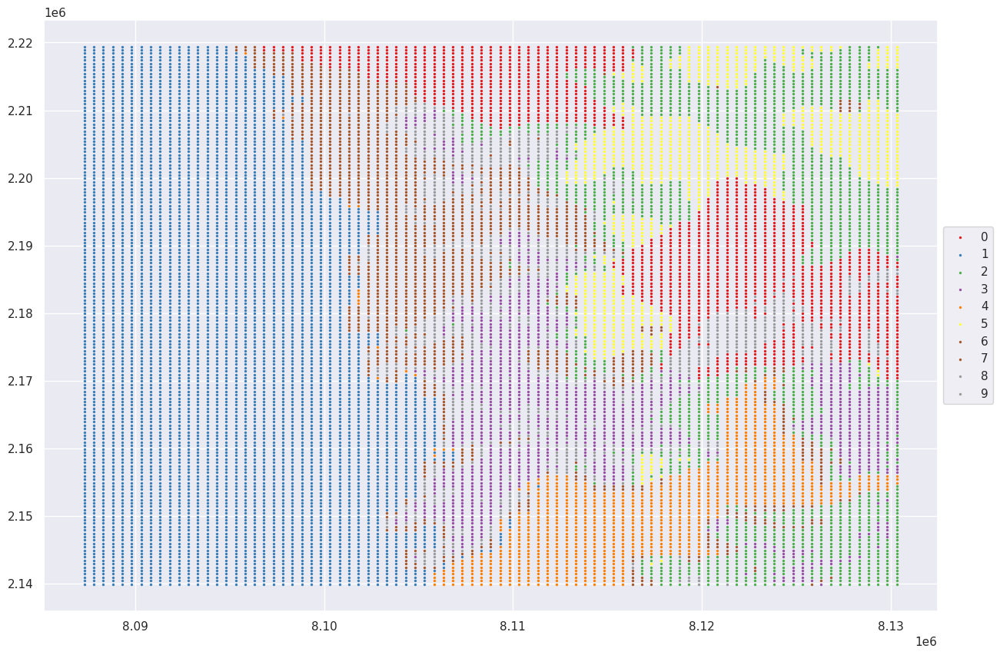

In [ ]:
map_clustering_results(df_coords, ac_model)

# **Approach 2: K-Means Clustering**

In [ ]:
km_model = KMeans(
    n_clusters=10,
)

In [ ]:
km_model.fit(scaled_df)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=10)

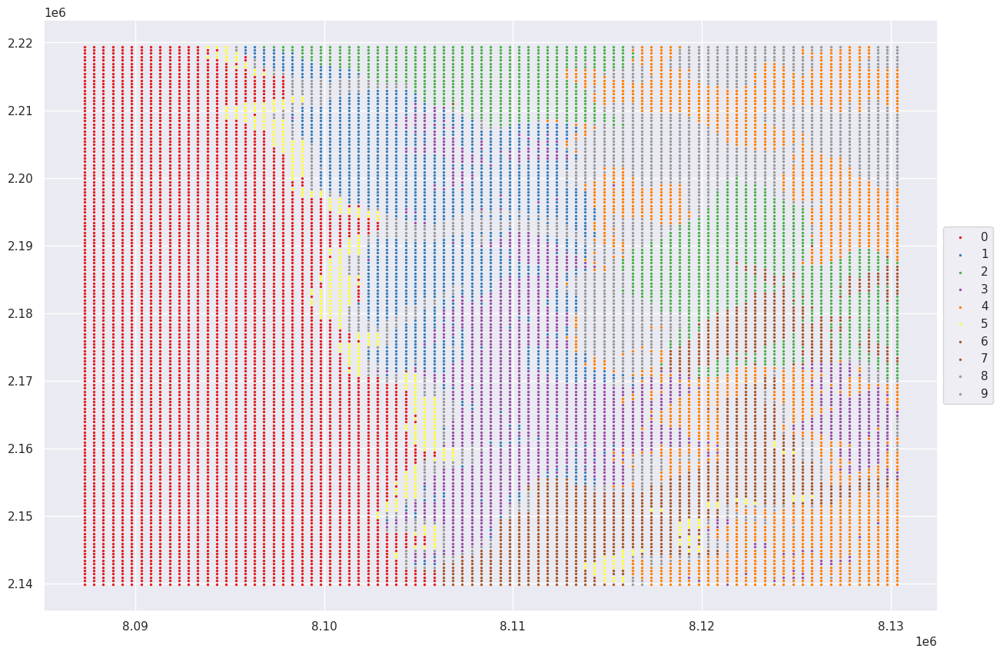

In [ ]:
map_clustering_results(df_coords, km_model)

The same code resctructured in a callable function:

In [ ]:
def computeKmeans(nClusters, dataDf, coordsDF):
  # initialize kmeans model
  km_model_new = KMeans(
    n_clusters=nClusters,
    n_init =10)

  #fit model with data
  km_model_new.fit(dataDf)

  #visualize clusters
  map_clustering_results(coordsDF, km_model_new)

  # inertia_ --> sum of squared errors, the higher
  squaredError = km_model_new.inertia_

  # extract cluster ID for each data point
  clusterID = km_model_new.labels_
  return clusterID, squaredError

# **Compute & Visualize Clusters interactively**

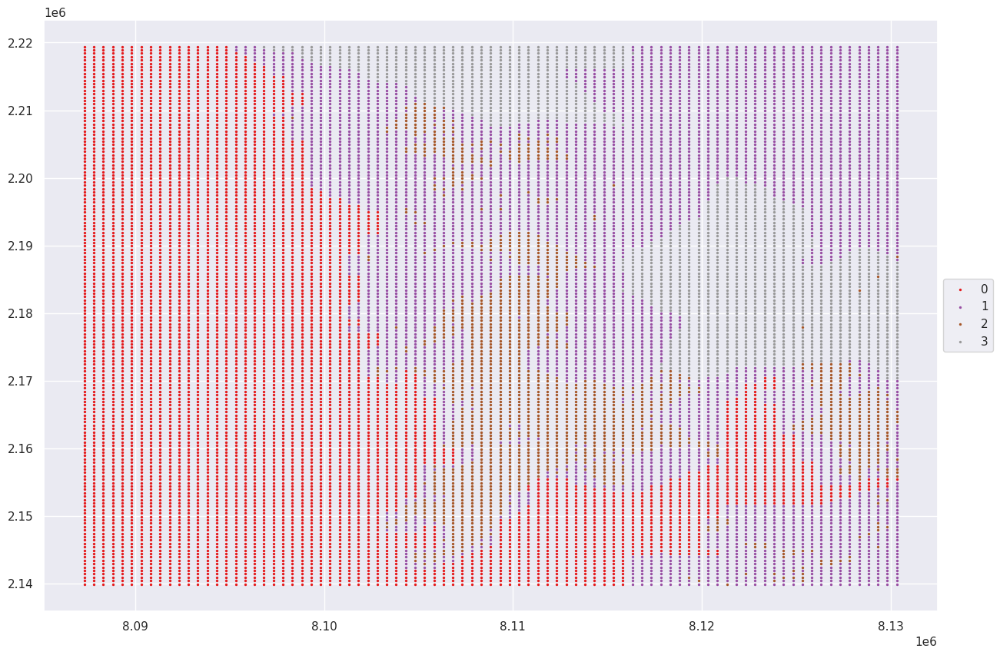

In [ ]:
#@title Compute & Visualize Clusters interactively { run: "auto" }
nClusters = 5 #@param {type:"slider", min:2, max:10, step:1}
clusterID, _ = computeKmeans(nClusters, scaled_df, df_coords)

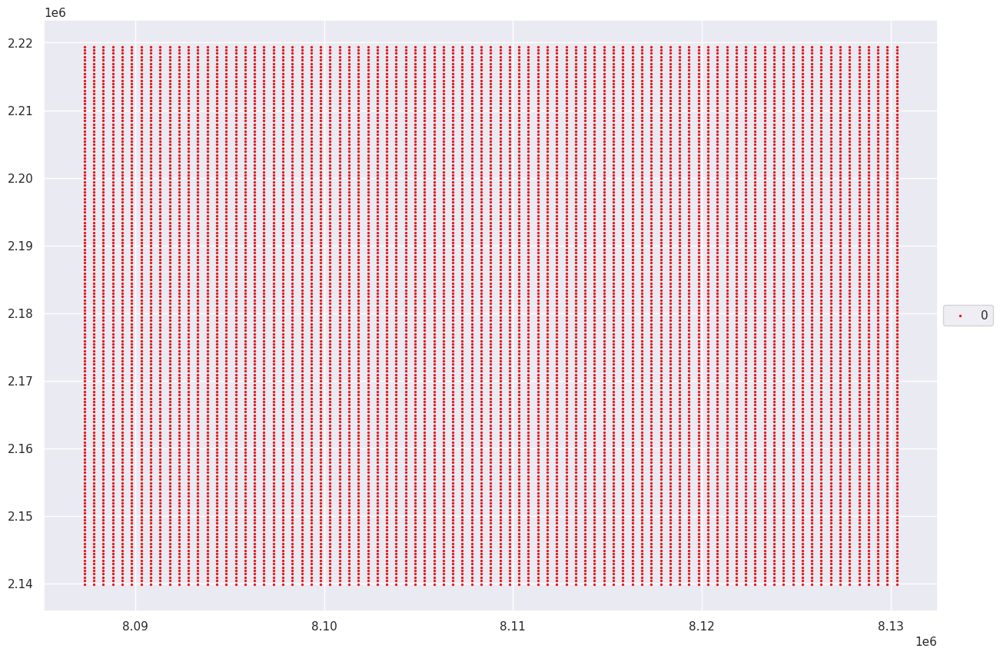

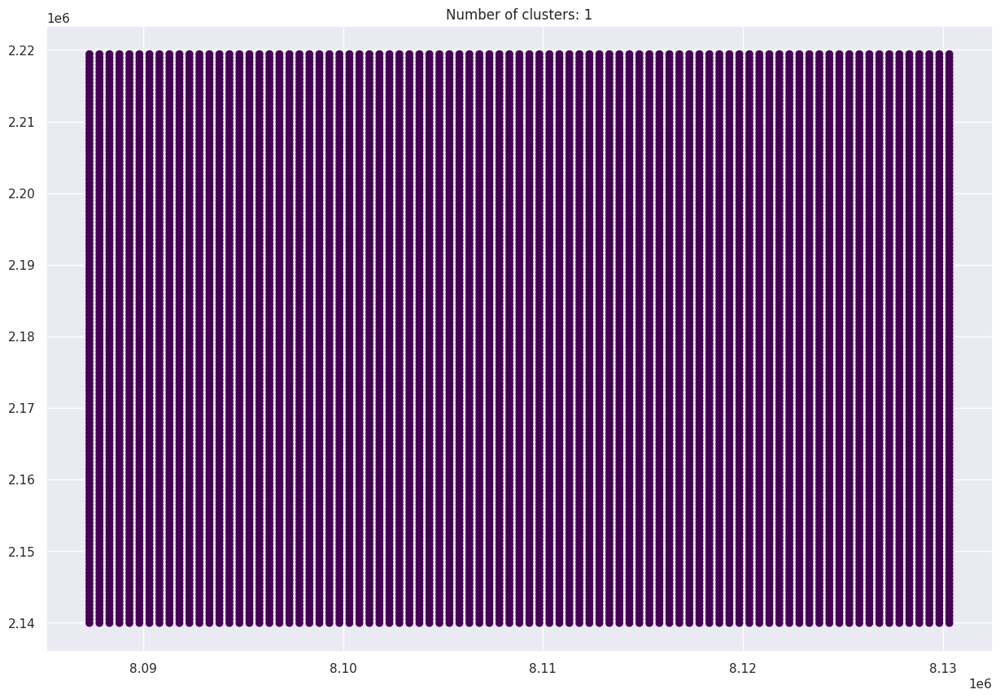

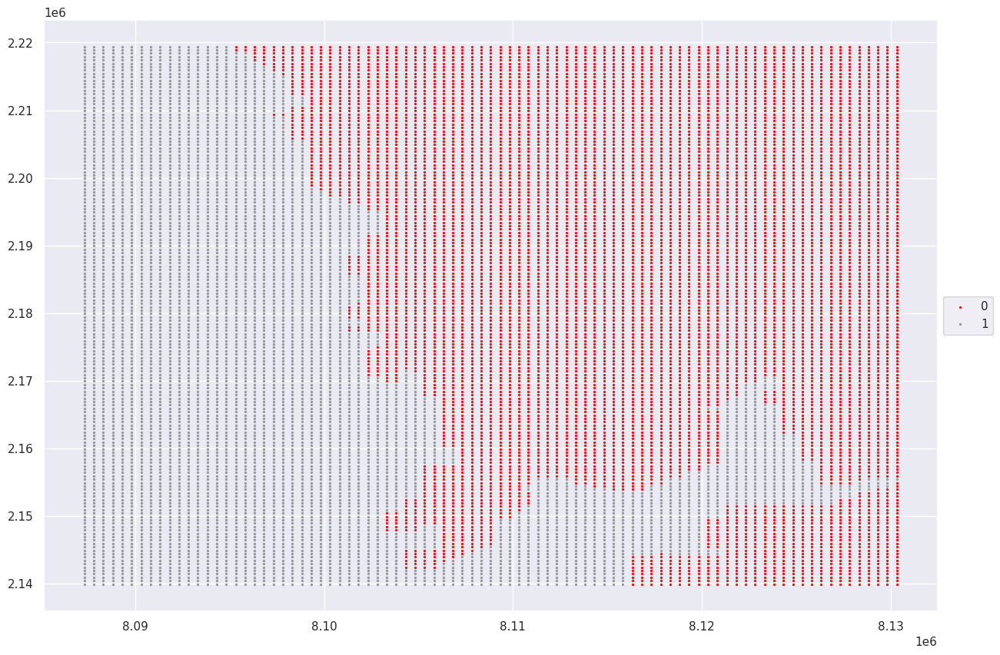

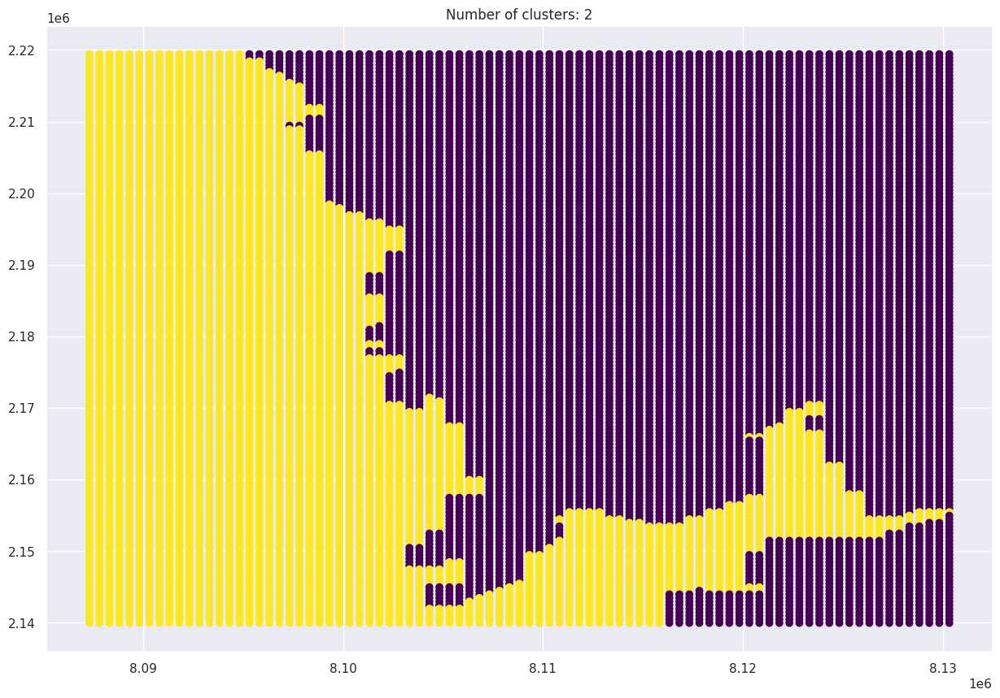

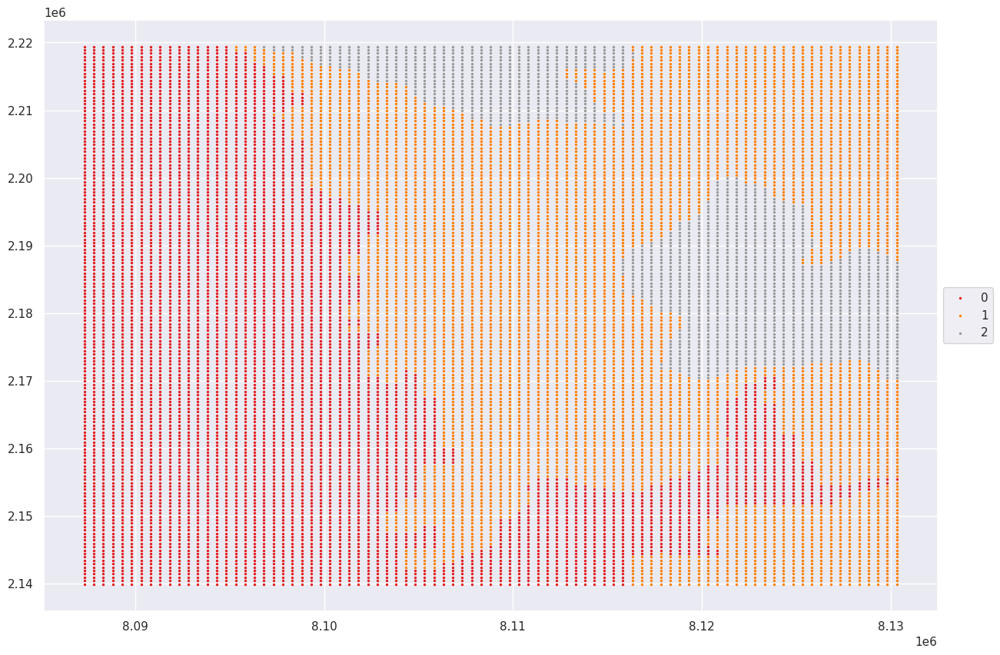

...

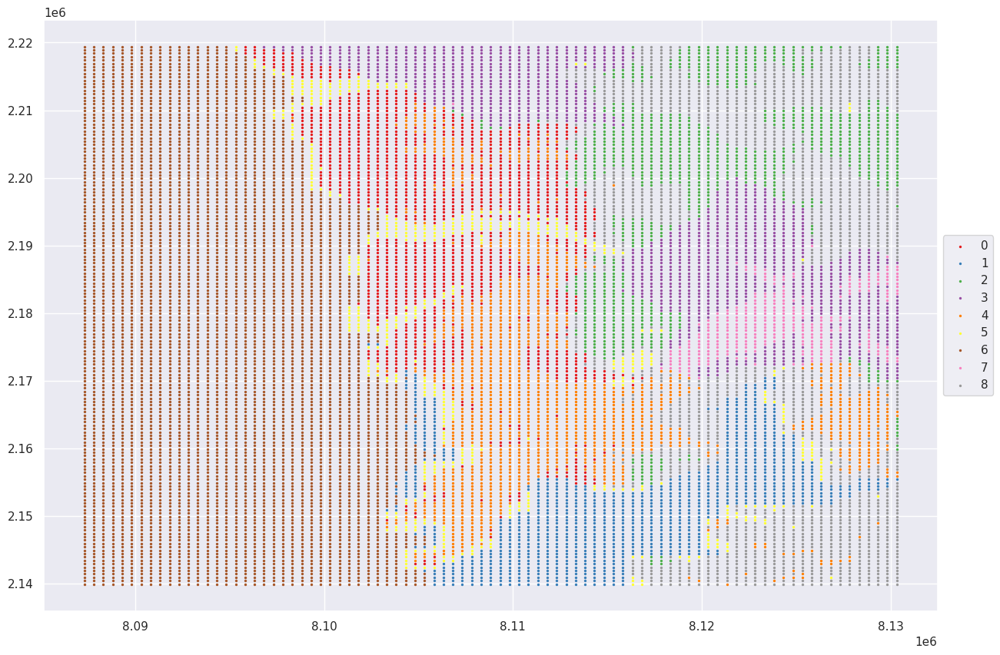

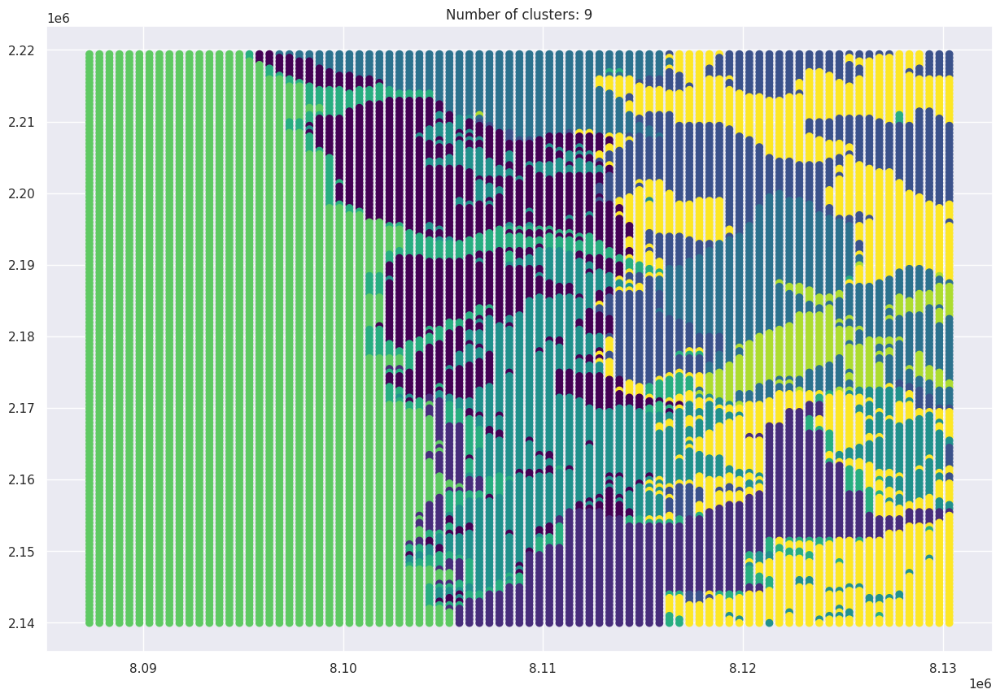

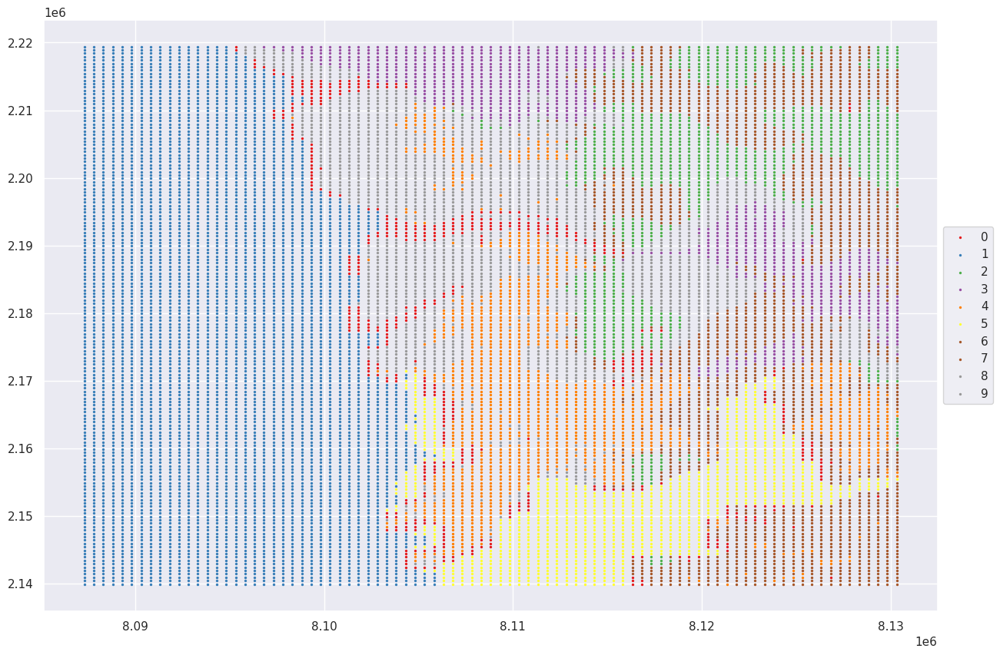

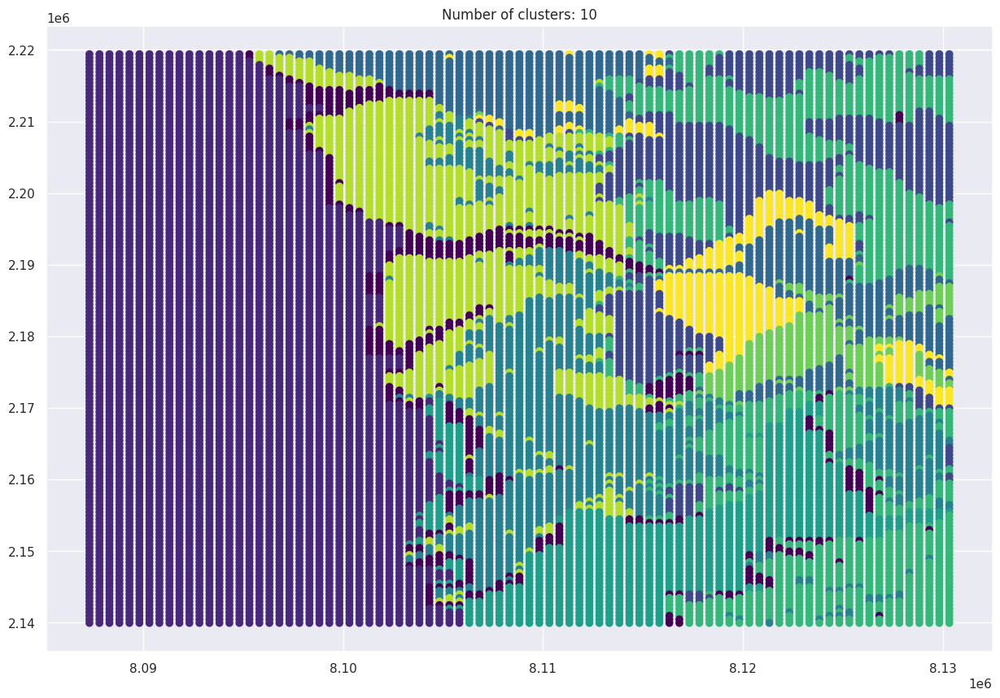

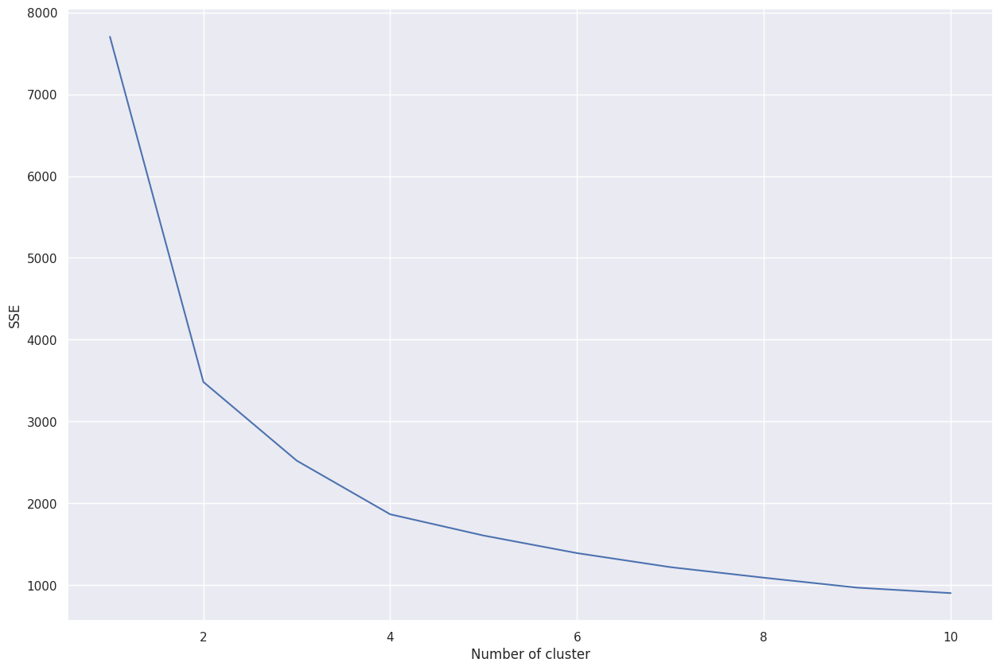

In [ ]:
# elbow method
#squaredError = []
#numClusters = []

# run function 10 times and plot error + number of clusters
#for i in range(10):
 # numCl = i+1
  #_, err = computeKmeans(numCl, scaled_df, df_coords)
  #numClusters.append(numCl)
  #squaredError.append(err)

#plt.figure()
#plt.plot(numClusters, squaredError)
#plt.xlabel("Number of cluster")
#plt.ylabel("SSE")
#plt.show()

# elbow method
squaredError = []

# run function 10 times and plot error for each number of clusters
for numCl in range(1, 11):
    cluster_labels, err = computeKmeans(numCl, scaled_df, df_coords)
    squaredError.append(err)

    # plot each cluster separately
    plt.figure()
    plt.scatter(df_coords.values[:, 0], df_coords.values[:, 1], c=cluster_labels, cmap='viridis')
    plt.title(f"Number of clusters: {numCl}")
    plt.show()

# plot error + number of clusters
numClusters = range(1, 11)
plt.figure()
plt.plot(numClusters, squaredError)
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

# **Analyse Clusters**

Closer look at each cluster individually: what makes them differ from each other? where are similarities?

In [ ]:
# add "clusterID" as new column to our original dataframe (before normalization)
df["clusterID"] = clusterID

slected cluster:  3
number of data points in cluster:  1681


,,


,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

mean
RTerraVeg          16.74
RHydroBas          90.99
RImperv            12.05
RBuiltUp            9.28
RSTRMTopo          23.64
RTidalWet           0.53
REcoregion         86.00
RAquaVeg           59.60
RSoilWater         57.16
RHydroGlob          4.99
X             8118584.13
Y             2193436.31
id              10057.48
clusterID           3.00
dtype: float64


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

mean, difference to all data points
RTerraVeg    -0.05
RHydroBas     2.87
RImperv       0.19
RBuiltUp      0.33
RSTRMTopo     0.19
RTidalWet     2.26
REcoregion    0.71
RAquaVeg      0.03
RSoilWater    0.70
RHydroGlob    1.87
X             0.00
Y             0.01
id            0.44
clusterID     2.19
dtype: float64


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

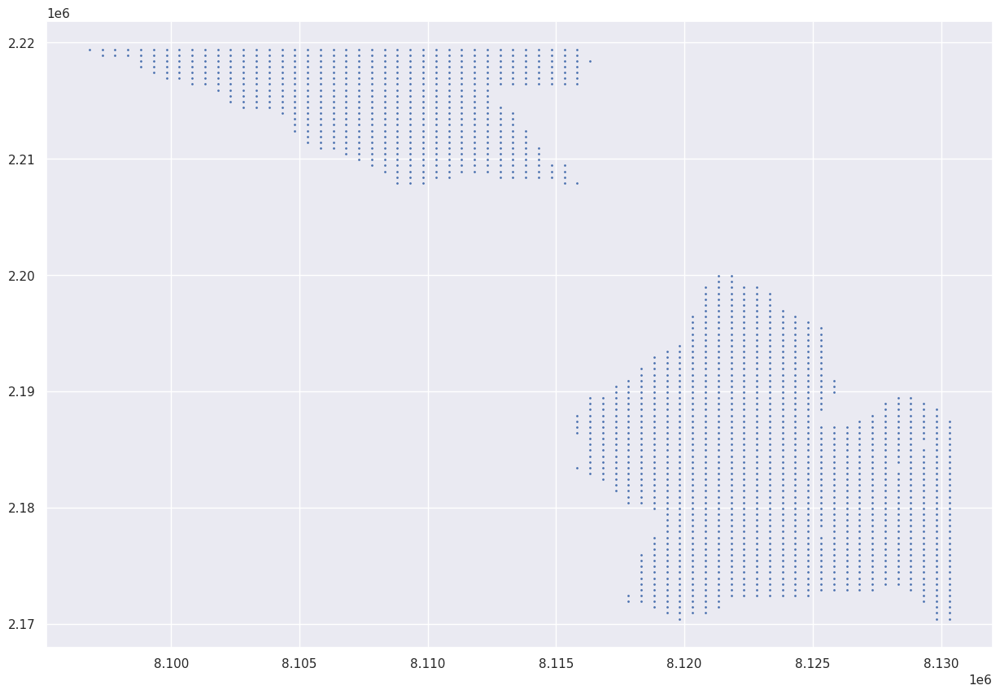

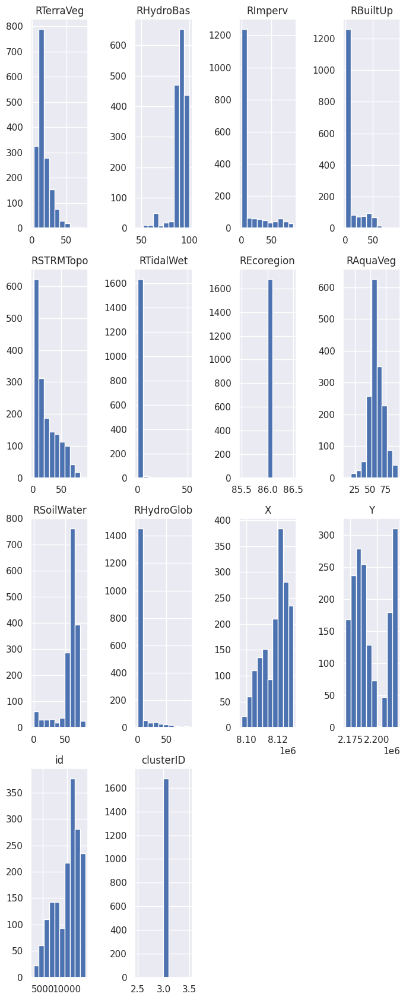

<IPython.core.display.Javascript object>

['__call__', '__class__', '__delattr__', '__dir__', '__doc__', '__eq__', '__format__', '__func__', '__ge__', '__get__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__self__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__wrapped__']


In [ ]:
# Define scatter plot dot size
dot_size = 1

df["clusterID"] = clusterID

selectedCluster = 3 #@param {type:"slider", min:0, max:12, step:1}

# boolean filter -> True when Cluster ID of data point == selected cluster ID
mask = df['clusterID'] == selectedCluster
print ("slected cluster: ", selectedCluster)

# apply mask to data frame and create a new data frame with the sub-set of data points
cluster_df = df[mask]
print("number of data points in cluster: ",len(cluster_df.index) )

# analyse & visualize ----------------------------------------------------------

# colab layouting using colab widgets
grid_tot = widgets.Grid(1, 3)
grid_rel = widgets.Grid(1, 3)

with grid_tot.output_to(0, 0):
  # compute mean value for each column/variable
  print("mean")
  print(cluster_df.mean().round(2))
with grid_tot.output_to(0, 1):
  # compute difference of mean value for each column/variable (cluster vs. all data points)
  print("mean, difference to all data points")
  print(((cluster_df.mean()-df.mean())/df.mean()).round(2))

with grid_tot.output_to(0, 2):
  # highlight cluster on map with smaller scatter plot dots
  plt.scatter(cluster_df["X"].tolist(), cluster_df["Y"].tolist(), s=dot_size)

  df_hist_layout_x = 4
  df_hist_layout_y = int((len(cluster_df.columns)/df_hist_layout_x)+1)

  ax = cluster_df.hist(figsize=(7,17), layout=(df_hist_layout_y,df_hist_layout_x))
  plt.tight_layout()
  plt.show()

print (dir(grid_tot.output_to))

# **BOX PLOT**

In [ ]:
import plotly.graph_objs as go

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#9b59b6', '#3498db', '#34495e', '#1abc9c', '#2ecc71', '#f1c40f', '#e67e22', '#e74c3c', '#95a5a6', '#f39c12']


data = []
exclude_cols = ['id', 'clusterID', 'X', 'Y']

for col in df.columns:
    if col not in exclude_cols:
        data.append(
            go.Bar(
                x=df['clusterID'],
                y=df[col],
                name=col,
                marker=dict(color=colors[len(data)])
            )
        )

fig = go.Figure(data=data)
fig.update_layout(
    title='Category Bar Chart',
    xaxis=dict(title='Cluster ID'),
    yaxis=dict(title='Count'),
    barmode='group', # set barmode to 'group' to group the bars for each category
    plot_bgcolor='#c1c1c1'
)
fig.show()
plt.show()

# **EXPORT**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pip install geopandas
import geopandas as gpd
from shapely.geometry import Point
labels = km_model.labels_
# Add the labels to the original DataFrame
df_coords['label'] = labels
# Convert the DataFrame to a GeoDataFrame
geometry = gpd.points_from_xy(df_coords['X'], df_coords['Y'])
gdf = gpd.GeoDataFrame(df_coords, geometry=geometry)
# Save the GeoDataFrame as a shapefile
gdf.to_file('/content/drive/MyDrive/BSSA/05_URBAN AI.WORKSHOP/FINAL FILE/SHETH.shp')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-78-66b409e6378c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

ERROR:fiona._env:Failed to create file /content/drive/MyDrive/BSSA/05_URBAN AI.WORKSHOP/FINAL FILE/SHETH.shp: No such file or directory


DriverIOError: Failed to create file /content/drive/MyDrive/BSSA/05_URBAN AI.WORKSHOP/FINAL FILE/SHETH.shp: No such file or directory